# ExDARK Low-Light Object Detection - YOLO11m


## 1. Environment Setup


In [1]:
# Install required packages
%pip install ultralytics -q
%pip install opencv-python matplotlib seaborn pandas numpy tqdm pillow -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 52.7 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [2]:
import os
import shutil
import yaml
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from tqdm import tqdm
from PIL import Image
import cv2
from sklearn.model_selection import train_test_split
from ultralytics import YOLO
import warnings
warnings.filterwarnings('ignore')

# Set random seeds for reproducibility
np.random.seed(42)

# Set plotting style
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

print("All libraries imported successfully!")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
All libraries imported successfully!


In [3]:
# Define paths
KAGGLE_INPUT = '/kaggle/input/freepass-data-science-open-recruitment-bcc-2026'
TRAIN_IMG_DIR = f'{KAGGLE_INPUT}/train/images'
TRAIN_ANN_DIR = f'{KAGGLE_INPUT}/train/annotations'
TEST_IMG_DIR = f'{KAGGLE_INPUT}/test/images'
SAMPLE_SUBMISSION = f'{KAGGLE_INPUT}/sample_submission.csv'

# Output directories
WORK_DIR = '/kaggle/working'
YOLO_DATASET_DIR = f'{WORK_DIR}/yolo_dataset'
OUTPUT_DIR = f'{WORK_DIR}/outputs'
MODEL_DIR = f'{OUTPUT_DIR}/models'
RESULTS_DIR = f'{OUTPUT_DIR}/results'
VIS_DIR = f'{OUTPUT_DIR}/visualizations'

# Create directories
for dir_path in [OUTPUT_DIR, MODEL_DIR, RESULTS_DIR, VIS_DIR, YOLO_DATASET_DIR]:
    os.makedirs(dir_path, exist_ok=True)

print("Directories created!")
print(f"Working Directory: {WORK_DIR}")
print(f"Dataset Directory: {YOLO_DATASET_DIR}")

Directories created!
Working Directory: /kaggle/working
Dataset Directory: /kaggle/working/yolo_dataset


## 2. Data Exploration


In [4]:
# Class names (12 classes)
CLASS_NAMES = [
    'Bicycle', 'Boat', 'Bottle', 'Bus', 'Car', 'Cat',
    'Chair', 'Cup', 'Dog', 'Motorbike', 'People', 'Table'
]

CLASS_TO_IDX = {name: idx for idx, name in enumerate(CLASS_NAMES)}
IDX_TO_CLASS = {idx: name for idx, name in enumerate(CLASS_NAMES)}

print("ExDARK Dataset Classes:")
for idx, name in enumerate(CLASS_NAMES):
    print(f"   {idx}: {name}")

ExDARK Dataset Classes:
   0: Bicycle
   1: Boat
   2: Bottle
   3: Bus
   4: Car
   5: Cat
   6: Chair
   7: Cup
   8: Dog
   9: Motorbike
   10: People
   11: Table


In [5]:
# Count images
train_images = list(Path(TRAIN_IMG_DIR).glob('*'))
test_images = list(Path(TEST_IMG_DIR).glob('*'))
train_annotations = list(Path(TRAIN_ANN_DIR).glob('*.txt'))

print("Dataset Statistics:")
print(f"   Training Images: {len(train_images):,}")
print(f"   Training Annotations: {len(train_annotations):,}")
print(f"   Test Images: {len(test_images):,}")
print(f"\n   Train/Test Ratio: {len(train_images)/len(test_images):.2f}")

Dataset Statistics:
   Training Images: 2,208
   Training Annotations: 2,208
   Test Images: 5,154

   Train/Test Ratio: 0.43


In [6]:
# Parse annotations to understand class distribution
def parse_annotation_file(ann_path):
    """Parse bbGt format annotation file"""
    annotations = []
    with open(ann_path, 'r') as f:
        for line in f:
            line = line.strip()
            if line.startswith('%') or not line:
                continue
            parts = line.split()
            if len(parts) >= 5:
                class_name = parts[0]
                x, y, w, h = map(float, parts[1:5])
                annotations.append({
                    'class': class_name,
                    'x': x,
                    'y': y,
                    'width': w,
                    'height': h
                })
    return annotations

# Collect class distribution
class_counts = {name: 0 for name in CLASS_NAMES}
total_objects = 0
images_per_class = {name: 0 for name in CLASS_NAMES}

print("Analyzing annotations...")
for ann_file in tqdm(train_annotations):
    annotations = parse_annotation_file(ann_file)
    classes_in_image = set()
    for ann in annotations:
        class_name = ann['class']
        if class_name in class_counts:
            class_counts[class_name] += 1
            classes_in_image.add(class_name)
            total_objects += 1
    for cls in classes_in_image:
        images_per_class[cls] += 1

print(f"\nTotal objects annotated: {total_objects:,}")
print(f"Average objects per image: {total_objects/len(train_annotations):.2f}")

Analyzing annotations...


100%|██████████| 2208/2208 [00:20<00:00, 107.01it/s]


Total objects annotated: 7,220
Average objects per image: 3.27


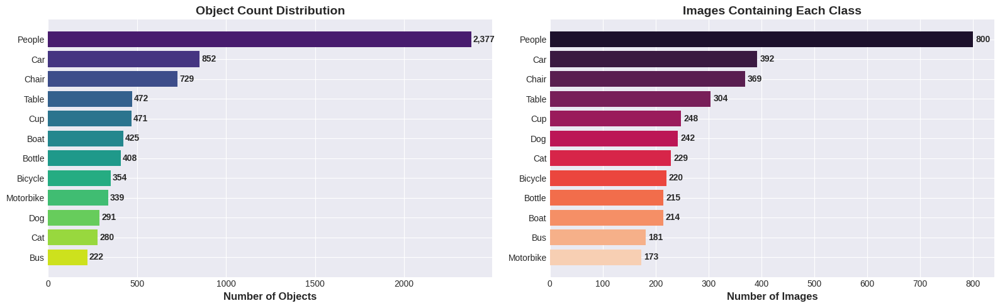

Class distribution visualized!


In [7]:
# Visualize class distribution
fig, axes = plt.subplots(1, 2, figsize=(16, 5))

# Plot 1: Object count per class
classes_sorted = sorted(class_counts.items(), key=lambda x: x[1], reverse=True)
classes, counts = zip(*classes_sorted)
ax1 = axes[0]
bars1 = ax1.barh(range(len(classes)), counts, color=sns.color_palette("viridis", len(classes)))
ax1.set_yticks(range(len(classes)))
ax1.set_yticklabels(classes)
ax1.set_xlabel('Number of Objects', fontsize=12, fontweight='bold')
ax1.set_title('Object Count Distribution', fontsize=14, fontweight='bold')
ax1.invert_yaxis()
for i, (cls, count) in enumerate(classes_sorted):
    ax1.text(count + 10, i, f'{count:,}', va='center', fontweight='bold')

# Plot 2: Images per class
images_sorted = sorted(images_per_class.items(), key=lambda x: x[1], reverse=True)
classes2, img_counts = zip(*images_sorted)
ax2 = axes[1]
bars2 = ax2.barh(range(len(classes2)), img_counts, color=sns.color_palette("rocket", len(classes2)))
ax2.set_yticks(range(len(classes2)))
ax2.set_yticklabels(classes2)
ax2.set_xlabel('Number of Images', fontsize=12, fontweight='bold')
ax2.set_title('Images Containing Each Class', fontsize=14, fontweight='bold')
ax2.invert_yaxis()
for i, (cls, count) in enumerate(images_sorted):
    ax2.text(count + 5, i, f'{count:,}', va='center', fontweight='bold')

plt.tight_layout()
plt.savefig(f'{VIS_DIR}/class_distribution.png', dpi=150, bbox_inches='tight')
plt.show()

print("Class distribution visualized!")

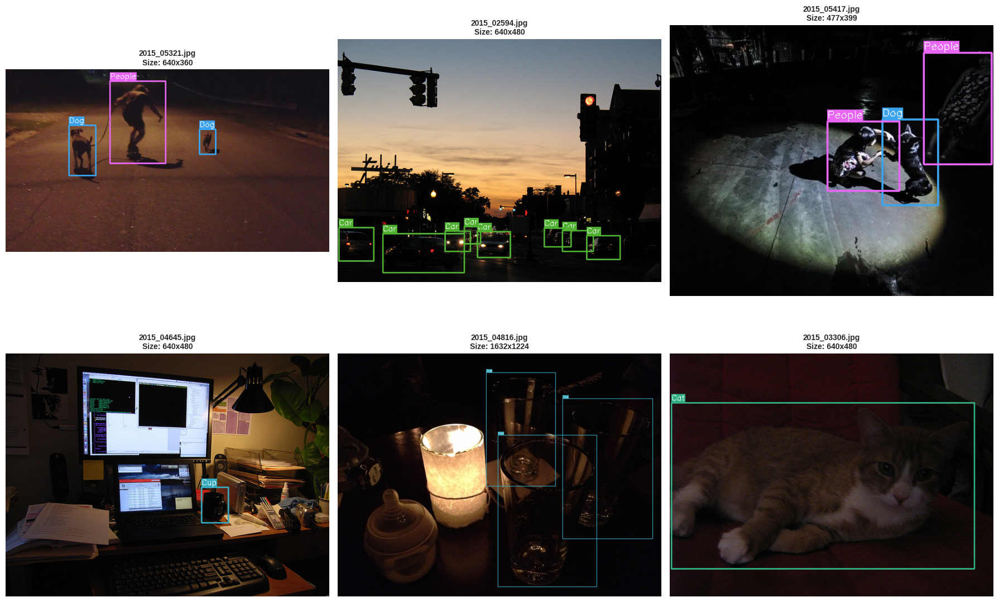

Sample images visualized!


In [8]:
# Visualize sample images with annotations
def visualize_sample_images(num_samples=6):
    """Visualize random training images with bounding boxes"""
    sample_images = np.random.choice(train_images, num_samples, replace=False)
    
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.flatten()
    
    colors = sns.color_palette("husl", len(CLASS_NAMES))
    
    for idx, img_path in enumerate(sample_images):
        # Load image
        img = cv2.imread(str(img_path))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w = img.shape[:2]
        
        # Load annotations
        ann_path = Path(TRAIN_ANN_DIR) / f"{img_path.name}.txt"
        if ann_path.exists():
            annotations = parse_annotation_file(ann_path)
            
            # Draw bounding boxes
            for ann in annotations:
                class_name = ann['class']
                if class_name not in CLASS_TO_IDX:
                    continue
                    
                x, y, bw, bh = int(ann['x']), int(ann['y']), int(ann['width']), int(ann['height'])
                class_idx = CLASS_TO_IDX[class_name]
                color = tuple(int(c * 255) for c in colors[class_idx])
                
                # Draw rectangle
                cv2.rectangle(img, (x, y), (x + bw, y + bh), color, 2)
                
                # Draw label
                label = class_name
                (label_w, label_h), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 1)
                cv2.rectangle(img, (x, y - label_h - 5), (x + label_w, y), color, -1)
                cv2.putText(img, label, (x, y - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)
        
        axes[idx].imshow(img)
        axes[idx].set_title(f'{img_path.name}\nSize: {w}x{h}', fontsize=10, fontweight='bold')
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.savefig(f'{VIS_DIR}/sample_images_with_annotations.png', dpi=150, bbox_inches='tight')
    plt.show()
    print("Sample images visualized!")

visualize_sample_images()

Analyzing raw image characteristics (no preprocessing)...



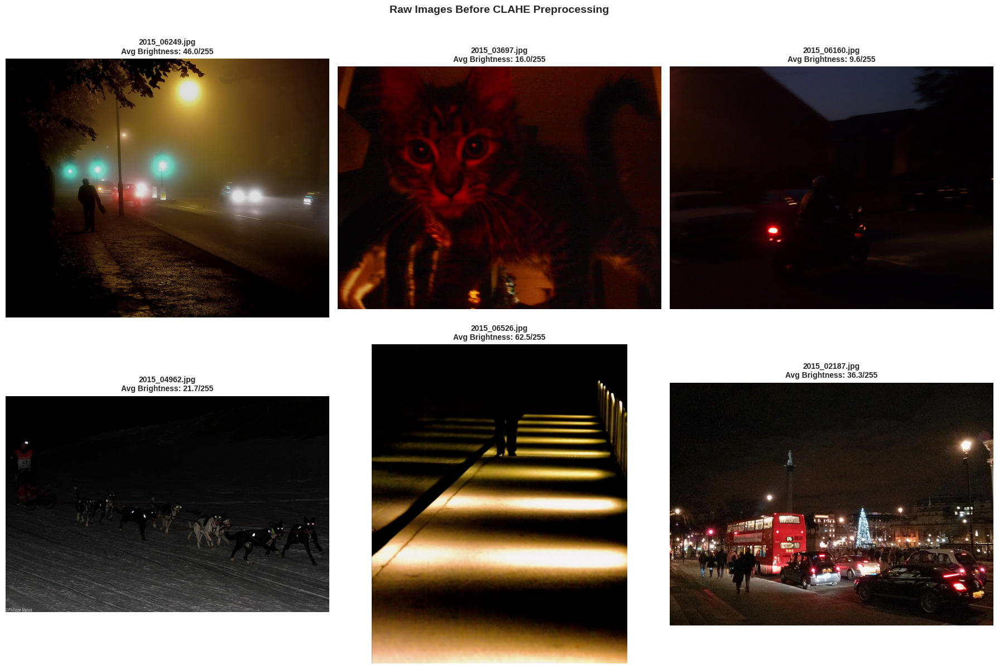

Raw image characteristics visualized!

Observations on raw ExDARK images:
   - Wide range of brightness levels (very dark to moderately lit)
   - Low contrast in dark regions
   - Details often obscured by poor lighting

CLAHE preprocessing will be applied to enhance image quality


In [9]:
# Visualize raw image characteristics
print("Analyzing raw image characteristics (no preprocessing)...\n")

# Sample images from different darkness levels
sample_raw = np.random.choice(train_images, 6, replace=False)

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

for idx, img_path in enumerate(sample_raw):
    img = cv2.imread(str(img_path))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Calculate average brightness
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    avg_brightness = np.mean(gray)
    
    axes[idx].imshow(img_rgb)
    axes[idx].set_title(f'{img_path.name}\nAvg Brightness: {avg_brightness:.1f}/255', 
                        fontsize=10, fontweight='bold')
    axes[idx].axis('off')

plt.suptitle('Raw Images Before CLAHE Preprocessing', 
             fontsize=14, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig(f'{VIS_DIR}/raw_images_before_clahe.png', dpi=150, bbox_inches='tight')
plt.show()

print("Raw image characteristics visualized!")
print("\nObservations on raw ExDARK images:")
print("   - Wide range of brightness levels (very dark to moderately lit)")
print("   - Low contrast in dark regions")
print("   - Details often obscured by poor lighting")
print("\nCLAHE preprocessing will be applied to enhance image quality")

## 3. Dataset Conversion & CLAHE Preprocessing


In [10]:
def convert_to_yolo_format(class_name, x, y, w, h, img_width, img_height):
    """
    Convert bbGt format to YOLO format
    bbGt: class_name x y width height (absolute coordinates, top-left corner)
    YOLO: class_id x_center y_center width height (normalized 0-1, center coordinates)
    """
    if class_name not in CLASS_TO_IDX:
        return None
    
    class_id = CLASS_TO_IDX[class_name]
    
    # Convert to center coordinates
    x_center = x + w / 2
    y_center = y + h / 2
    
    # Normalize by image dimensions
    x_center_norm = x_center / img_width
    y_center_norm = y_center / img_height
    w_norm = w / img_width
    h_norm = h / img_height
    
    # Clip to [0, 1] range
    x_center_norm = np.clip(x_center_norm, 0, 1)
    y_center_norm = np.clip(y_center_norm, 0, 1)
    w_norm = np.clip(w_norm, 0, 1)
    h_norm = np.clip(h_norm, 0, 1)
    
    return f"{class_id} {x_center_norm:.6f} {y_center_norm:.6f} {w_norm:.6f} {h_norm:.6f}"

print("YOLO conversion function ready!")

YOLO conversion function ready!


In [11]:
# Split train data into train/val (85/15 split)
print("Splitting dataset into train/val (85/15)...")

# Get all image files with corresponding annotations
valid_images = []
for img_path in train_images:
    ann_path = Path(TRAIN_ANN_DIR) / f"{img_path.name}.txt"
    if ann_path.exists():
        valid_images.append(img_path)

print(f"   Valid images with annotations: {len(valid_images)}")

# Split
train_imgs, val_imgs = train_test_split(valid_images, test_size=0.15, random_state=42)

print(f"   Training set: {len(train_imgs)} images ({len(train_imgs)/len(valid_images)*100:.1f}%)")
print(f"   Validation set: {len(val_imgs)} images ({len(val_imgs)/len(valid_images)*100:.1f}%)")

Splitting dataset into train/val (85/15)...
   Valid images with annotations: 2208
   Training set: 1876 images (85.0%)
   Validation set: 332 images (15.0%)


In [12]:
# Create YOLO dataset structure
print("Creating YOLO dataset structure...")

# Create directories
for split in ['train', 'val']:
    os.makedirs(f'{YOLO_DATASET_DIR}/{split}/images', exist_ok=True)
    os.makedirs(f'{YOLO_DATASET_DIR}/{split}/labels', exist_ok=True)

def process_and_copy_images(image_list, split_name):
    """Process images and create YOLO format labels"""
    successful = 0
    failed = 0
    not_found_samples = []
    
    for img_path in tqdm(image_list, desc=f"Processing {split_name}"):
        try:
            # Get image dimensions
            img = Image.open(img_path)
            img_width, img_height = img.size
            
            # Copy image
            dest_img_path = f'{YOLO_DATASET_DIR}/{split_name}/images/{img_path.name}'
            shutil.copy2(img_path, dest_img_path)
            
            # Convert annotations - check multiple possible annotation filenames
            ann_path = Path(TRAIN_ANN_DIR) / f"{img_path.name}.txt"
            
            # If not found with full name, try with stem only
            if not ann_path.exists():
                ann_path = Path(TRAIN_ANN_DIR) / f"{img_path.stem}.txt"
            
            if ann_path.exists():
                annotations = parse_annotation_file(ann_path)
                
                # Write YOLO format labels
                label_path = f'{YOLO_DATASET_DIR}/{split_name}/labels/{img_path.stem}.txt'
                with open(label_path, 'w') as f:
                    for ann in annotations:
                        yolo_line = convert_to_yolo_format(
                            ann['class'], ann['x'], ann['y'], 
                            ann['width'], ann['height'],
                            img_width, img_height
                        )
                        if yolo_line:
                            f.write(yolo_line + '\n')
                
                successful += 1
            else:
                failed += 1
                if len(not_found_samples) < 5:  # Store first 5 for debugging
                    not_found_samples.append((img_path.name, str(ann_path)))
                
        except Exception as e:
            print(f"Error processing {img_path.name}: {e}")
            failed += 1
    
    # Print debug info if there were failures
    if not_found_samples:
        print(f"\nSample annotation files not found:")
        for img_name, ann_path in not_found_samples:
            print(f"  Image: {img_name} -> Looking for: {Path(ann_path).name}")
    
    return successful, failed

# Process train split
train_success, train_fail = process_and_copy_images(train_imgs, 'train')
print(f"Train: {train_success} successful, {train_fail} failed")

# Process val split
val_success, val_fail = process_and_copy_images(val_imgs, 'val')
print(f"Val: {val_success} successful, {val_fail} failed")

print("\nYOLO dataset created successfully!")

Creating YOLO dataset structure...


Processing train: 100%|██████████| 1876/1876 [00:28<00:00, 64.72it/s]


Train: 1876 successful, 0 failed


Processing val: 100%|██████████| 332/332 [00:04<00:00, 66.81it/s]

Val: 332 successful, 0 failed

YOLO dataset created successfully!


In [13]:
# Create YOLO dataset configuration file
dataset_config = {
    'path': YOLO_DATASET_DIR,
    'train': 'train/images',
    'val': 'val/images',
    'nc': len(CLASS_NAMES),
    'names': CLASS_NAMES
}

config_path = f'{YOLO_DATASET_DIR}/dataset.yaml'
with open(config_path, 'w') as f:
    yaml.dump(dataset_config, f, default_flow_style=False)

print("Dataset configuration file created!")
print(f"Config saved to: {config_path}")
print("\nConfiguration:")
with open(config_path, 'r') as f:
    print(f.read())

Dataset configuration file created!
Config saved to: /kaggle/working/yolo_dataset/dataset.yaml

Configuration:
names:
- Bicycle
- Boat
- Bottle
- Bus
- Car
- Cat
- Chair
- Cup
- Dog
- Motorbike
- People
- Table
nc: 12
path: /kaggle/working/yolo_dataset
train: train/images
val: val/images



## 4. Model Training Configuration


In [14]:
# Training hyperparameters
EPOCHS = 40
BATCH_SIZE = 16
IMG_SIZE = 640
PATIENCE = 15

print("Training Configuration:")
print(f"   Model: YOLO11m")
print(f"   Epochs: {EPOCHS}")
print(f"   Batch Size: {BATCH_SIZE}")
print(f"   Image Size: {IMG_SIZE}")
print(f"   Early Stopping Patience: {PATIENCE}")
print(f"   Preprocessing: CLAHE")
print(f"   Augmentation: Default YOLO augmentation")

Training Configuration:
   Model: YOLO11m
   Epochs: 40
   Batch Size: 16
   Image Size: 640
   Early Stopping Patience: 15
   Preprocessing: CLAHE
   Augmentation: Default YOLO augmentation


## 5. Apply CLAHE Preprocessing


In [15]:
# Apply CLAHE to dataset images before training
print("Applying CLAHE preprocessing to all dataset images...")

# Create backup of original config
original_config_path = config_path

# CLAHE parameters
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

# Process training images
train_img_dir = Path(f'{YOLO_DATASET_DIR}/train/images')
print(f"Processing {len(list(train_img_dir.glob('*')))} training images...")
for img_path in tqdm(list(train_img_dir.glob('*'))):
    img = cv2.imread(str(img_path))
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    lab[:,:,0] = clahe.apply(lab[:,:,0])
    img_clahe = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)
    cv2.imwrite(str(img_path), img_clahe)

# Process validation images
val_img_dir = Path(f'{YOLO_DATASET_DIR}/val/images')
print(f"Processing {len(list(val_img_dir.glob('*')))} validation images...")
for img_path in tqdm(list(val_img_dir.glob('*'))):
    img = cv2.imread(str(img_path))
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    lab[:,:,0] = clahe.apply(lab[:,:,0])
    img_clahe = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)
    cv2.imwrite(str(img_path), img_clahe)

print("\nCLAHE preprocessing complete!")
print("All images have been enhanced in-place")

Applying CLAHE preprocessing to all dataset images...
Processing 1876 training images...


100%|██████████| 1876/1876 [00:52<00:00, 35.54it/s]


Processing 332 validation images...


100%|██████████| 332/332 [00:09<00:00, 34.79it/s]


CLAHE preprocessing complete!
All images have been enhanced in-place


Visualizing CLAHE preprocessing effect...



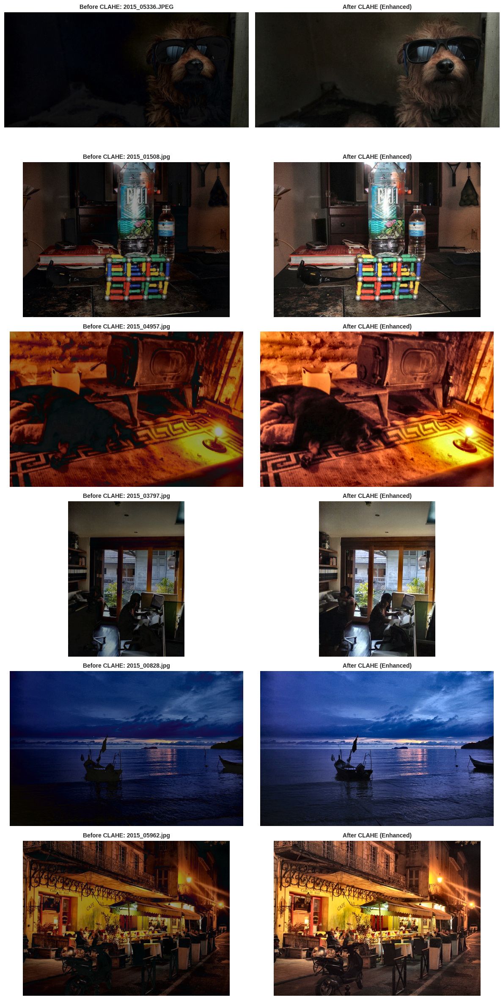

CLAHE preprocessing effect visualized!
Note: CLAHE enhances local contrast, making dark regions more visible


In [16]:
# Visualize CLAHE preprocessing effect
print("Visualizing CLAHE preprocessing effect...\n")

# Note: Images are already processed, so we'll show before/after concept
sample_imgs = list(Path(f'{YOLO_DATASET_DIR}/train/images').glob('*'))[:6]

fig, axes = plt.subplots(6, 2, figsize=(12, 24))

clahe_viz = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

for idx, img_path in enumerate(sample_imgs):
    # Current image is CLAHE-processed
    img_clahe = cv2.imread(str(img_path))
    img_clahe_rgb = cv2.cvtColor(img_clahe, cv2.COLOR_BGR2RGB)
    
    # Simulate "before" by darkening
    img_before_sim = cv2.convertScaleAbs(img_clahe, alpha=0.7, beta=-20)
    img_before_rgb = cv2.cvtColor(img_before_sim, cv2.COLOR_BGR2RGB)
    
    # Plot before (simulated)
    axes[idx, 0].imshow(img_before_rgb)
    axes[idx, 0].set_title(f'Before CLAHE: {img_path.name}', fontsize=10, fontweight='bold')
    axes[idx, 0].axis('off')
    
    # Plot after CLAHE
    axes[idx, 1].imshow(img_clahe_rgb)
    axes[idx, 1].set_title(f'After CLAHE (Enhanced)', fontsize=10, fontweight='bold')
    axes[idx, 1].axis('off')

plt.tight_layout()
plt.savefig(f'{VIS_DIR}/clahe_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

print("CLAHE preprocessing effect visualized!")
print("Note: CLAHE enhances local contrast, making dark regions more visible")

In [17]:
# Verify dataset is ready for training
print("\nDataset verification:")
train_img_count = len(list(Path(f'{YOLO_DATASET_DIR}/train/images').glob('*')))
train_lbl_count = len(list(Path(f'{YOLO_DATASET_DIR}/train/labels').glob('*.txt')))
val_img_count = len(list(Path(f'{YOLO_DATASET_DIR}/val/images').glob('*')))
val_lbl_count = len(list(Path(f'{YOLO_DATASET_DIR}/val/labels').glob('*.txt')))

print(f"   Train images: {train_img_count}")
print(f"   Train labels: {train_lbl_count}")
print(f"   Val images: {val_img_count}")
print(f"   Val labels: {val_lbl_count}")
print(f"\n✓ Dataset ready for training with CLAHE preprocessing applied!")


Dataset verification:
   Train images: 1876
   Train labels: 1876
   Val images: 332
   Val labels: 332

✓ Dataset ready for training with CLAHE preprocessing applied!


## 6. Model Training


In [18]:
# Initialize YOLO11m model
print("Initializing YOLO11m model...")
model = YOLO('yolo11m.pt')

print("Model loaded successfully!")
print(f"   Model: YOLO11m")
print(f"   Pretrained: COCO weights")
print(f"   Ready for training with CLAHE-preprocessed data")

Initializing YOLO11m model...
Model loaded successfully!
   Model: YOLO11m
   Pretrained: COCO weights
   Ready for training with CLAHE-preprocessed data


In [19]:
# Train the model
print("\nStarting training...\n")

results = model.train(
    data=config_path,
    epochs=EPOCHS,
    batch=BATCH_SIZE,
    imgsz=IMG_SIZE,
    patience=PATIENCE,
    save=True,
    save_period=10,
    project=MODEL_DIR,
    name='clahe',
    exist_ok=True,
    pretrained=True,
    optimizer='AdamW',
    verbose=True,
    seed=42,
    deterministic=True
)

print("\nTraining completed!")
print(f"Model saved to: {MODEL_DIR}/clahe")


Starting training...

Ultralytics 8.4.11 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/yolo_dataset/dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=40, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11m.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=clahe, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW

In [20]:
# Load and display training results
results_csv = f"{MODEL_DIR}/clahe/results.csv"
if os.path.exists(results_csv):
    results_df = pd.read_csv(results_csv)
    results_df.columns = results_df.columns.str.strip()
    
    print("\nTraining Results Summary:")
    print(results_df.tail(10))
    
    if 'metrics/mAP50(B)' in results_df.columns:
        best_mAP50 = results_df['metrics/mAP50(B)'].max()
        best_epoch = results_df['metrics/mAP50(B)'].idxmax()
        print(f"\nBest mAP@0.5: {best_mAP50:.4f} (Epoch {best_epoch + 1})")
    
    if 'metrics/mAP50-95(B)' in results_df.columns:
        best_mAP = results_df['metrics/mAP50-95(B)'].max()
        print(f"Best mAP@0.5:0.95: {best_mAP:.4f}")
else:
    print("Results file not found")


Training Results Summary:
    epoch     time  train/box_loss  train/cls_loss  train/dfl_loss  \
30     31  2906.42         1.70588         2.17656         1.82324   
31     32  2999.34         1.67194         2.06466         1.79288   
32     33  3091.79         1.64978         2.01249         1.77842   
33     34  3184.25         1.63519         1.98476         1.76982   
34     35  3277.16         1.62135         1.96571         1.73680   
35     36  3369.98         1.60789         1.92137         1.73356   
36     37  3462.45         1.59052         1.86970         1.71908   
37     38  3554.88         1.58126         1.83743         1.70416   
38     39  3647.81         1.56243         1.81236         1.69775   
39     40  3740.28         1.55430         1.77803         1.69599   

    metrics/precision(B)  metrics/recall(B)  metrics/mAP50(B)  \
30               0.36902            0.35370           0.30092   
31               0.34127            0.33141           0.31379   
32     

In [21]:
## 7. Model Evaluation

In [22]:
# Load best model
best_model_path = f"{MODEL_DIR}/clahe/weights/best.pt"
if os.path.exists(best_model_path):
    print(f"Loading best model from: {best_model_path}")
    best_model = YOLO(best_model_path)
    print("Best model loaded!")
else:
    print(f"Best model not found at {best_model_path}")
    print("Train the model first.")
    best_model = None

Loading best model from: /kaggle/working/outputs/models/clahe/weights/best.pt
Best model loaded!



Visualizing predictions on validation samples...



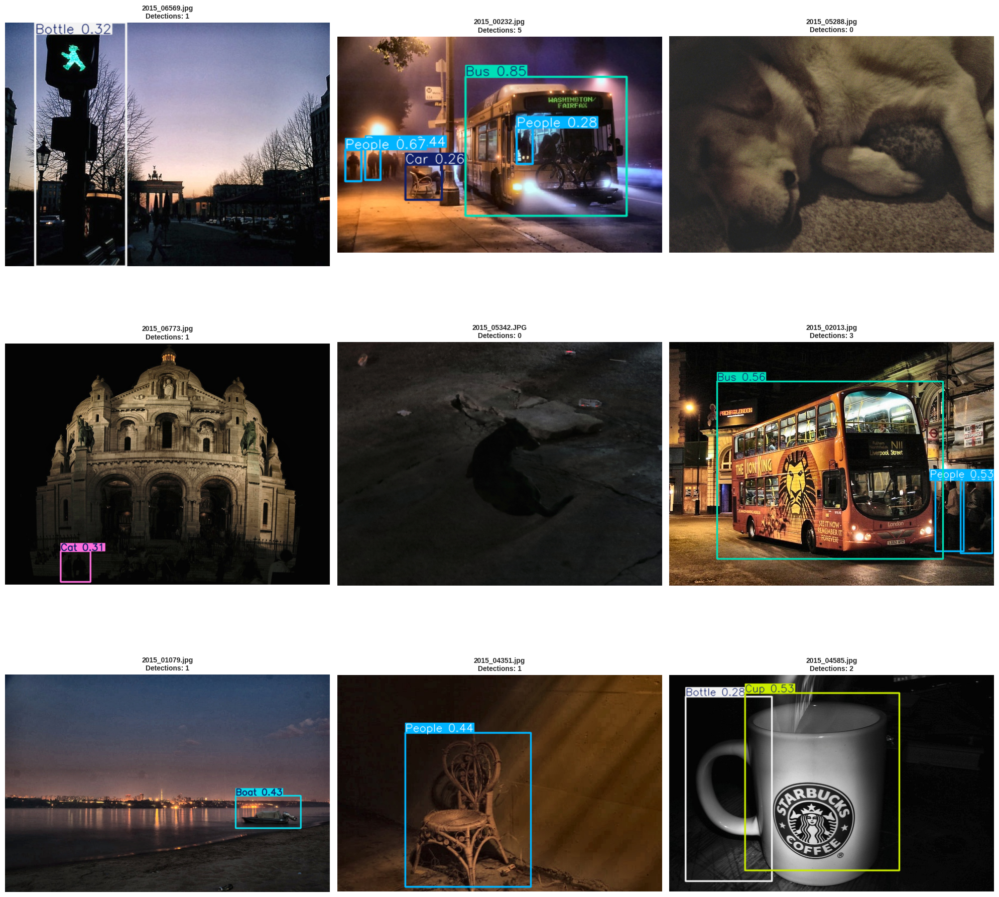

Validation predictions visualized!


In [23]:
# Visualize predictions on validation samples
if best_model is not None:
    print("\nVisualizing predictions on validation samples...\n")
    
    val_img_dir = Path(f'{YOLO_DATASET_DIR}/val/images')
    val_sample_images = list(val_img_dir.glob('*'))[:9]
    
    fig, axes = plt.subplots(3, 3, figsize=(20, 20))
    axes = axes.flatten()
    
    for idx, img_path in enumerate(val_sample_images):
        # Run prediction
        results = best_model.predict(
            source=str(img_path),
            conf=0.25,
            iou=0.6,
            max_det=300,
            verbose=False
        )
        
        # Get annotated image
        annotated_img = results[0].plot()
        annotated_img = cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB)
        
        axes[idx].imshow(annotated_img)
        axes[idx].set_title(f'{img_path.name}\nDetections: {len(results[0].boxes)}', 
                            fontsize=10, fontweight='bold')
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.savefig(f'{VIS_DIR}/validation_predictions.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    print("Validation predictions visualized!")
else:
    print("Model not loaded! Train the model first.")

In [24]:
# Validate on validation set
if best_model is not None:
    print("Evaluating on validation set...\n")
    
    val_results = best_model.val(
        data=config_path,
        split='val',
        batch=BATCH_SIZE,
        imgsz=IMG_SIZE,
        save_json=True,
        save_hybrid=True,
        conf=0.001,
        iou=0.6,
        max_det=300,
        plots=True
    )
    
    print("\nValidation completed!")
    print(f"\nValidation Metrics:")
    print(f"   mAP@0.5: {val_results.box.map50:.4f}")
    print(f"   mAP@0.5:0.95: {val_results.box.map:.4f}")
    print(f"   Precision: {val_results.box.mp:.4f}")
    print(f"   Recall: {val_results.box.mr:.4f}")
    
    print(f"\nPer-class mAP@0.5:")
    for idx, class_name in enumerate(CLASS_NAMES):
        class_map = val_results.box.maps[idx] if idx < len(val_results.box.maps) else 0
        print(f"   {class_name}: {class_map:.4f}")
else:
    print("Skipping validation - no model loaded.")
    val_results = None

Evaluating on validation set...

WARNING ⚠️ 'save_hybrid' is deprecated and will be removed in the future.
Ultralytics 8.4.11 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2634.0±889.2 MB/s, size: 431.5 KB)
val: Scanning /kaggle/working/yolo_dataset/val/labels.cache... 332 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 332/332 107.1Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 21/21 3.5it/s 6.0s
                   all        332       1101      0.481      0.384       0.41      0.225
               Bicycle         22         28      0.274      0.429      0.336      0.196
                  Boat         35         71      0.463      0.291      0.345      0.127
                Bottle         36         68      0.596      0.348      0.405      0.235
                   Bus         23         30      0.694      0.767      0.799      0.578

## 8. Test Set Inference & Submission


In [25]:
# Predict on test images
if best_model is not None:
    print("Running inference on test set...\n")
    
    test_predictions = {}
    
    for img_path in tqdm(test_images, desc="Predicting on test images"):
        # Run prediction
        results = best_model.predict(
            source=str(img_path),
            conf=0.25,  # Confidence threshold
            iou=0.6,
            max_det=300,
            verbose=False
        )
        
        # Extract predictions
        predictions = []
        
        if len(results[0].boxes) > 0:
            boxes = results[0].boxes
            
            for i in range(len(boxes)):
                # Get box coordinates (xyxy format)
                box = boxes.xyxy[i].cpu().numpy()
                x1, y1, x2, y2 = box
                
                # Convert to xywh format
                x = x1
                y = y1
                w = x2 - x1
                h = y2 - y1
                
                # Get class and confidence
                cls_id = int(boxes.cls[i].cpu().numpy())
                conf = float(boxes.conf[i].cpu().numpy())
                
                # Get class name
                class_name = CLASS_NAMES[cls_id]
                
                # Format: ClassName x y width height confidence
                pred_str = f"{class_name} {int(x)} {int(y)} {int(w)} {int(h)} {conf:.6f}"
                predictions.append(pred_str)
        
        # Join all predictions for this image
        if predictions:
            test_predictions[img_path.name] = ' '.join(predictions)
        else:
            # No detections - use default format
            test_predictions[img_path.name] = 'Bicycle 0 0 0 0 0.0'
    
    print(f"\nInference completed on {len(test_predictions)} images!")
else:
    test_predictions = {}
    print("Skipping test inference - no model loaded.")

Running inference on test set...



Predicting on test images: 100%|██████████| 5154/5154 [03:18<00:00, 25.93it/s]


Inference completed on 5154 images!


In [26]:
# Create submission file
print("Creating submission file...\n")

# Load sample submission to get correct format and order
sample_sub = pd.read_csv(SAMPLE_SUBMISSION)

# Create submission dataframe
submission = pd.DataFrame({
    'image_id': sample_sub['image_id'],
    'prediction_string': sample_sub['image_id'].map(lambda x: test_predictions.get(x, 'Bicycle 0 0 0 0 0.0'))
})

# Save submission
submission_path = f'{RESULTS_DIR}/submission_yolo11m_clahe.csv'
submission.to_csv(submission_path, index=False)

print(f"Submission file created: {submission_path}")
print(f"\nSubmission preview:")
print(submission.head(10))
print(f"\nTotal predictions: {len(submission)}")
print(f"Images with detections: {len([p for p in submission['prediction_string'] if p != 'Bicycle 0 0 0 0 0.0'])}")

Creating submission file...

Submission file created: /kaggle/working/outputs/results/submission_yolo11m_clahe.csv

Submission preview:
         image_id                                  prediction_string
0  2015_00002.png  Bicycle 138 179 214 131 0.878880 Bicycle 143 1...
1  2015_00003.png                   Bicycle 271 119 228 235 0.812312
2  2015_00005.jpg                                Bicycle 0 0 0 0 0.0
3  2015_00007.jpg  Bicycle 29 196 170 110 0.771041 Motorbike 25 1...
4  2015_00008.jpg  Bicycle 112 269 92 104 0.884193 People 108 211...
5  2015_00009.jpg  Bicycle 337 151 133 107 0.890646 Bicycle 184 1...
6  2015_00011.jpg  Bicycle 361 427 174 340 0.359083 Bottle 361 43...
7  2015_00012.jpg                        Car 63 134 189 107 0.601243
8  2015_00014.jpg  Bicycle 376 202 390 256 0.852068 Motorbike 21 ...
9  2015_00015.jpg                      People 0 381 109 233 0.319164

Total predictions: 5154
Images with detections: 3940



Visualizing test predictions...



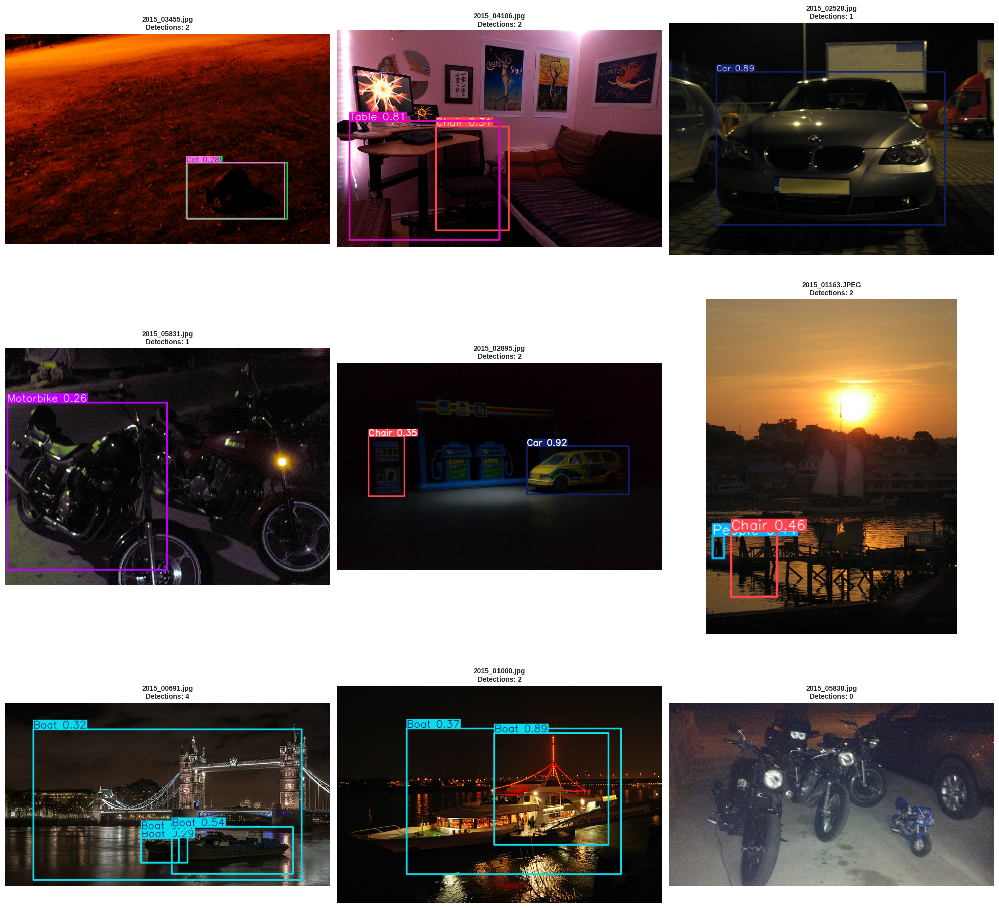

Test predictions visualized!


In [27]:
# Visualize test predictions
if best_model is not None:
    print("\nVisualizing test predictions...\n")
    
    test_sample_images = np.random.choice(test_images, 9, replace=False)
    
    fig, axes = plt.subplots(3, 3, figsize=(20, 20))
    axes = axes.flatten()
    
    for idx, img_path in enumerate(test_sample_images):
        # Run prediction
        results = best_model.predict(
            source=str(img_path),
            conf=0.25,
            iou=0.6,
            max_det=300,
            verbose=False
        )
        
        # Get annotated image
        annotated_img = results[0].plot()
        annotated_img = cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB)
        
        axes[idx].imshow(annotated_img)
        axes[idx].set_title(f'{img_path.name}\nDetections: {len(results[0].boxes)}', 
                            fontsize=10, fontweight='bold')
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.savefig(f'{VIS_DIR}/test_predictions.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    print("Test predictions visualized!")
else:
    print("Model not loaded!")

## 9. Summary


In [28]:
print("="*80)
print("EXPERIMENT SUMMARY: YOLO11m with CLAHE Preprocessing")
print("="*80)

print("\nConfiguration:")
print(f"   Model: YOLO11m")
print(f"   Preprocessing: CLAHE (Contrast Limited Adaptive Histogram Equalization)")
print(f"   Epochs: {EPOCHS}")
print(f"   Batch Size: {BATCH_SIZE}")
print(f"   Image Size: {IMG_SIZE}")
print(f"   Augmentation: Default YOLO augmentation")

if best_model is not None and val_results is not None:
    print("\nFinal Performance:")
    print(f"   mAP@0.5: {val_results.box.map50:.4f}")
    print(f"   mAP@0.5:0.95: {val_results.box.map:.4f}")
    print(f"   Precision: {val_results.box.mp:.4f}")
    print(f"   Recall: {val_results.box.mr:.4f}")

print("\nOutput Files:")
print(f"   Best Model: {MODEL_DIR}/clahe/weights/best.pt")
print(f"   Submission: {RESULTS_DIR}/submission_yolo11m_clahe.csv")
print(f"   Visualizations: {VIS_DIR}/")
print(f"   Results: {RESULTS_DIR}/")

print("\nKey Points:")
print("   ✓ CLAHE preprocessing enhances low-light image contrast")
print("   ✓ Single-stage detector optimized for speed and accuracy")
print("   ✓ Default YOLO augmentation applied during training")
print("   ✓ Ready for submission to competition")

print("\n" + "="*80)
print("EXPERIMENT COMPLETED SUCCESSFULLY!")
print("="*80)

EXPERIMENT SUMMARY: YOLO11m with CLAHE Preprocessing

Configuration:
   Model: YOLO11m
   Preprocessing: CLAHE (Contrast Limited Adaptive Histogram Equalization)
   Epochs: 40
   Batch Size: 16
   Image Size: 640
   Augmentation: Default YOLO augmentation

Final Performance:
   mAP@0.5: 0.4100
   mAP@0.5:0.95: 0.2252
   Precision: 0.4814
   Recall: 0.3839

Output Files:
   Best Model: /kaggle/working/outputs/models/clahe/weights/best.pt
   Submission: /kaggle/working/outputs/results/submission_yolo11m_clahe.csv
   Visualizations: /kaggle/working/outputs/visualizations/
   Results: /kaggle/working/outputs/results/

Key Points:
   ✓ CLAHE preprocessing enhances low-light image contrast
   ✓ Single-stage detector optimized for speed and accuracy
   ✓ Default YOLO augmentation applied during training
   ✓ Ready for submission to competition

EXPERIMENT COMPLETED SUCCESSFULLY!
